In [2]:
import os
import re

import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd
import umap
from sklearn.preprocessing import StandardScaler

In [20]:
ref = sc.read_h5ad('/home/estorrs/pollock/benchmarking/data/11302020_harmonized/teir_2/snRNAseq/ccrcc.h5ad')
sorted(set(ref.obs['cell_type']))

['Basophil',
 'CD4 CTL',
 'CD4 T cell',
 'CD4 T cell activated',
 'CD4 T cell naive',
 'CD4/CD8 proliferating',
 'CD8 CTL',
 'CD8 T cell preexhausted',
 'Endothelial',
 'Epithelial',
 'Fibroblast',
 'Macrophage',
 'Macrophage proliferating',
 'Malignant',
 'NK cell strong',
 'NK cell weak',
 'Plasma',
 'TRM',
 'Treg',
 'cDC',
 'mCAF',
 'pDC']

In [4]:
d = {
    'brca': '/home/estorrs/pollock/benchmarking/data/11302020_harmonized/teir_1/scRNAseq/brca.h5ad',
    'pdac': '/home/estorrs/pollock/benchmarking/data/11302020_harmonized/teir_1/scRNAseq/pdac.h5ad',
    'mmy': '/home/estorrs/data/single_cell_classification/tumor/myeloma/reyka_07082020.h5ad'
}

In [6]:
def process_from_counts(adata):
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    sc.pp.highly_variable_genes(adata, n_top_genes=3000)
    adata.raw = adata

    adata = adata[:, adata.var.highly_variable]
    # sc.pp.calculate_qc_metrics
    # sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])
    sc.pp.scale(adata)

    sc.tl.pca(adata, svd_solver='arpack')
    sc.pp.neighbors(adata, n_neighbors=10, n_pcs=50)
    sc.tl.umap(adata)
    
    return adata

In [7]:
for k in d.keys():
    print(k)
    d[k] = process_from_counts(sc.read_h5ad(d[k]))

brca


/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:806: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


pdac


/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:806: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


mmy


/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:806: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [9]:
markers = {
    'Pan-T': ['CD3G'],
    'CD8+': ['CD8A'],
    'CD4+': ['CD4'],
    'Naive': ['IL7R', 'CCR7', 'SELL', 'TCF7'],
    'Activated': ['CD69', 'CD28', 'CD44', 'DPP4'],
    'Proliferating': ['MKI67', 'TOP2A'],
    'Effector (CTL)': ['PRF1', 'GZMA', 'GZMB', 'GZMK', 'GNLY'],
    'Exausted': ['LAG3', 'HAVCR2', 'LAG3', 'EOMES', 'TIGIT'],
    #TCM CCR7+, SELL+, IL7Rhigh, CX3CR1+, IL2high
    #TEM CCR7-, SELL-, IL7Rhigh, CX3CR1+ , IL2low 
    'TCM/TEM': ['CCR7', 'SELL', 'CX3CR1', 'IL2'],
    'Treg': ['FOXP3'],
    'NK': ['GNLY', 'KLRD1', 'KLRB1', 'CD7'],
    'NK - Strong': ['FCGR3A', 'SPON2', 'KLRF1', 'PRF1', 'GZMB', 'GZMH', 'NKG7'],
    'NK - Weak': ['NCAM1', 'IL2RB'],
    'B': ['MS4A1'],
    'pre-B': ['IGLL1', 'VPREB1', 'CD24', 'STMN1', 'HIST1H1C', 'SOX4', 'MKI67'],
    'Plasma': ['SDC1', 'IGHG1', 'IGHG3', 'IGHG4', 'CD138', 'CD27', 'CD38'],
    'Granulocyte': ['FUT4'],
    'DC': ['ITGAX'],
    'pDC': ['IL3RA'],
    'PMN-MDSC': ['ITGAM', 'CD14', 'FUT4', 'CEACAM8', 'OLR1'],
    'M-MDSC': ['CD14', 'ITGAM', 'CD33', 'HLA-DRA', 'FUT4', 'CEACAM8', 'S100A9'],
    'Macrophage': ['CD68', 'AIF1', 'IFITM2', 'LST1', 'MS4A7'],
    'M1': ['CD86', 'NOS2', 'TNF', 'IL1B', 'CD38', 'CD40', 'SIGLEC1', 'FCGR3A', 'TLR2'],
    'M2': ['CD163', 'ARG1', 'IL10', 'IL4', 'SRSF10', 'MRC1', 'CD200R1', 'TGM2', 'TNFRSF6B', 'IL1R2', 'MSR1', 'TGM2'],
    'Erythrocyte': ['AHSP', 'ALAS2', 'CA1', 'GYPA'],
    'Monocyte': ['CD14', 'LYZ', 'S100A12', 'S100A8', 'S100A9'],
    'Non-classical Monocyte': ['FCGR3A'],
}

brca


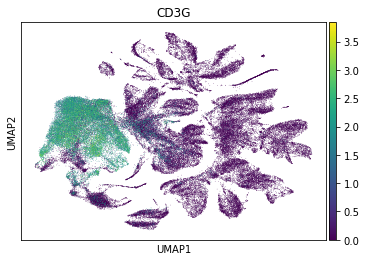

pdac


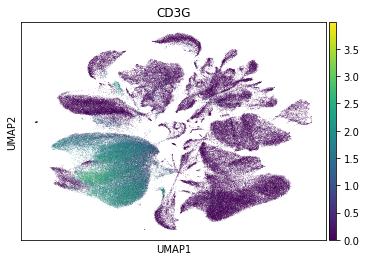

mmy


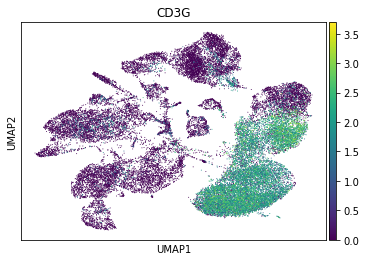

In [10]:
for k, adata in d.items():
    print(k)
    sc.pl.umap(adata, color=markers['Pan-T'])
    plt.show()

brca


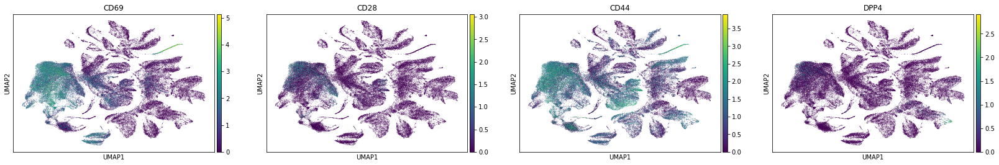

pdac


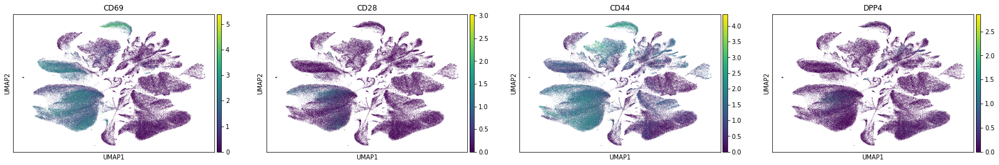

mmy


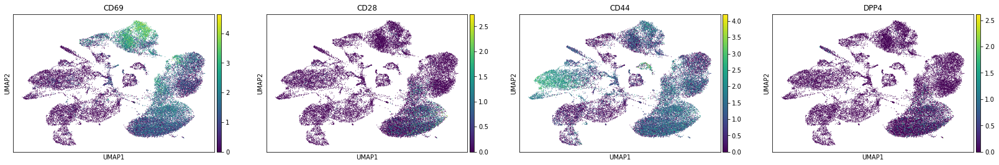

In [11]:
for k, adata in d.items():
    print(k)
    sc.pl.umap(adata, color=markers['Activated'])
    plt.show()

brca


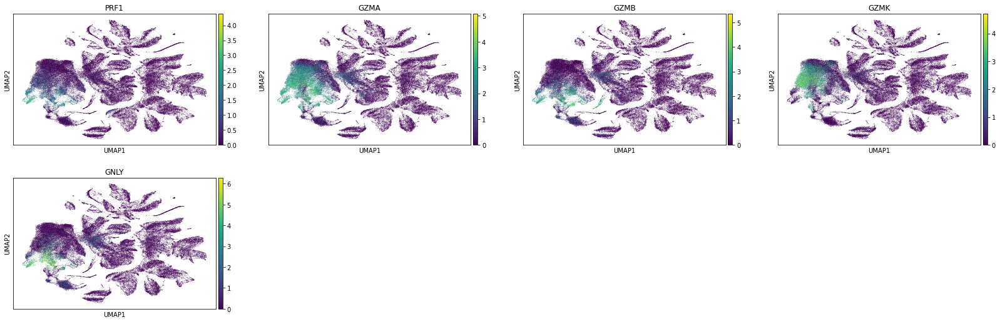

pdac


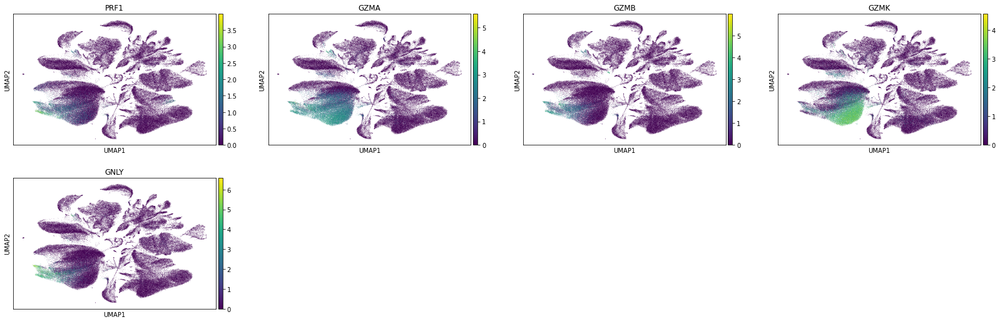

mmy


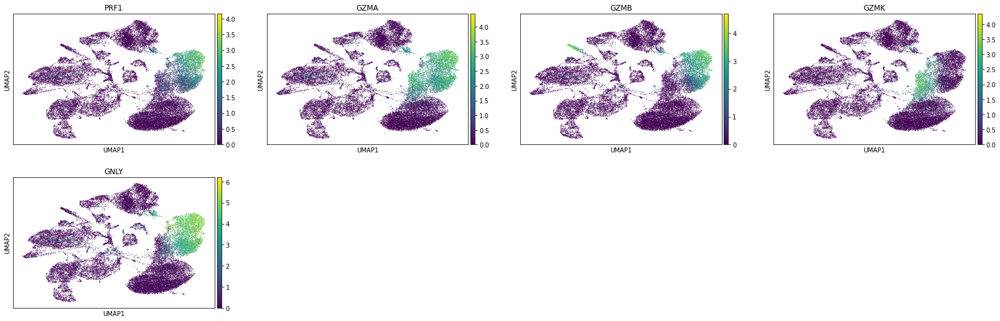

In [12]:
for k, adata in d.items():
    print(k)
    sc.pl.umap(adata, color=markers['Effector (CTL)'])
    plt.show()

brca


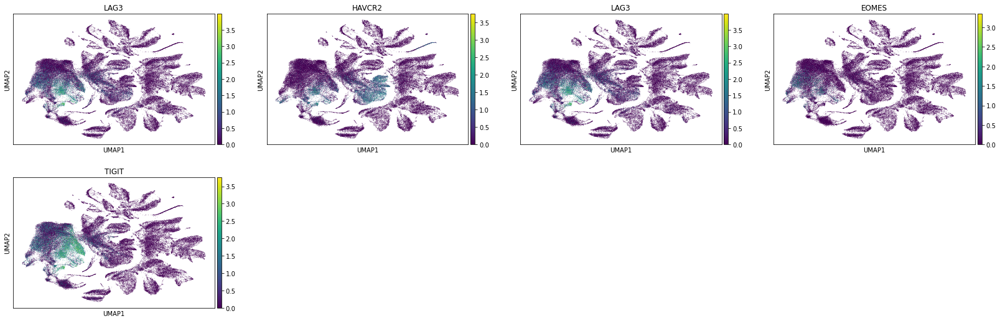

pdac


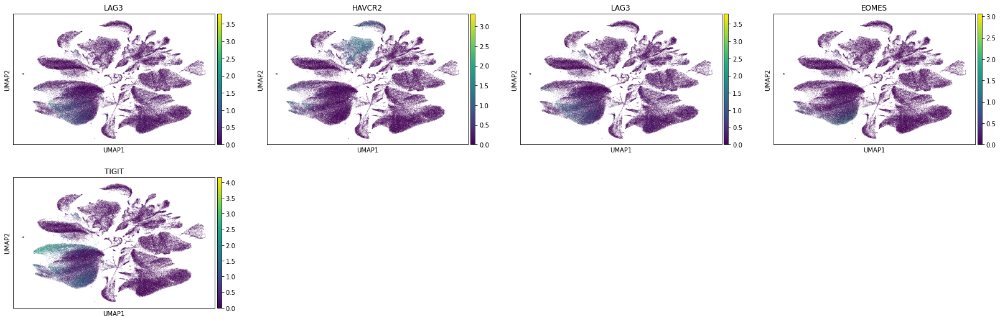

mmy


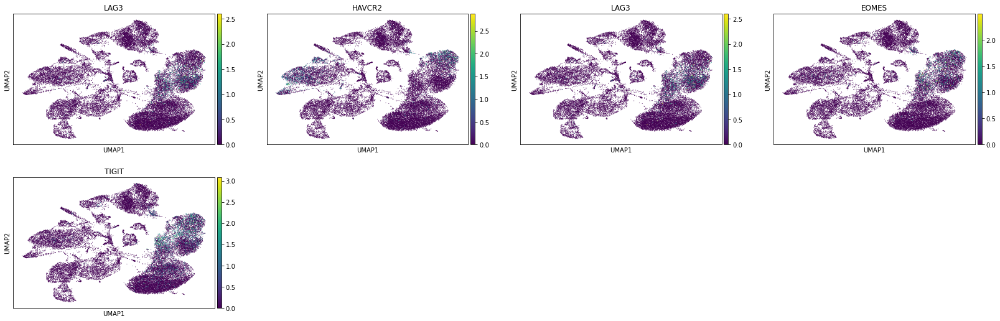

In [13]:
for k, adata in d.items():
    print(k)
    sc.pl.umap(adata, color=markers['Exausted'])
    plt.show()

In [14]:
adata = d['brca']

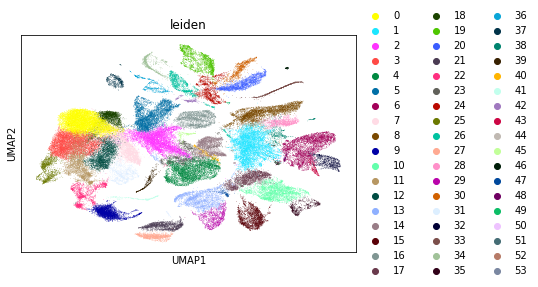

In [15]:
sc.tl.leiden(adata, resolution=1.)
sc.pl.umap(adata, color='leiden')

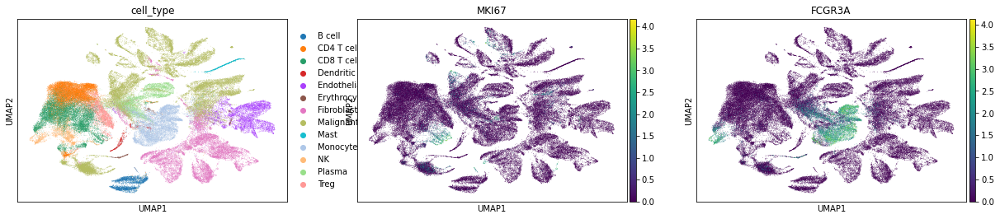

In [19]:
sc.pl.umap(adata, color=['cell_type', 'MKI67', 'FCGR3A'])

In [22]:
include = ['CD4 T cell', 'CD8 T cell', 'Dendritic', 'Monocyte', 'NK']
small = adata[[True if c in include else False for c in adata.obs['cell_type']]].copy()
small

AnnData object with n_obs × n_vars = 36207 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.5', 'seurat_clusters', 'sample', 'tissue_type', 'cell_type', 'cell_type_specific', 'Piece_ID', 'Clinical_Subtype', 'Bulk_PAM50', 'doublet_score', 'predicted_doublet', 'ident', 'leiden'
    var: 'sct.detection_rate', 'sct.gmean', 'sct.variance', 'sct.residual_mean', 'sct.residual_variance', 'sct.variable', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'cell_type_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'logcounts'
    obsp: 'distances', 'connectivities'

In [23]:
sc.tl.pca(small, svd_solver='arpack')
sc.pp.neighbors(small, n_neighbors=10, n_pcs=50)
sc.tl.umap(small)

In [73]:
sc.tl.leiden(small, resolution=1.5)

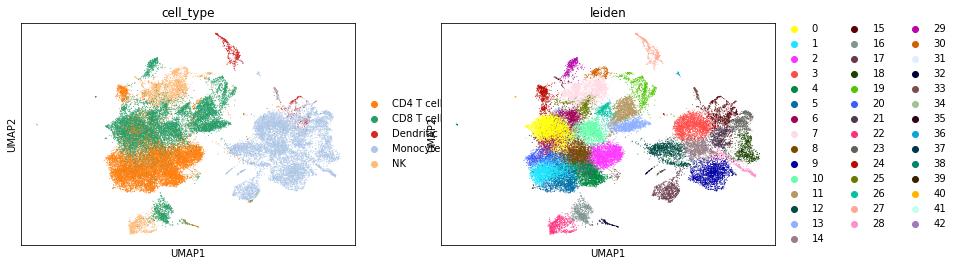

In [74]:
sc.pl.umap(small, color=['cell_type', 'leiden'])

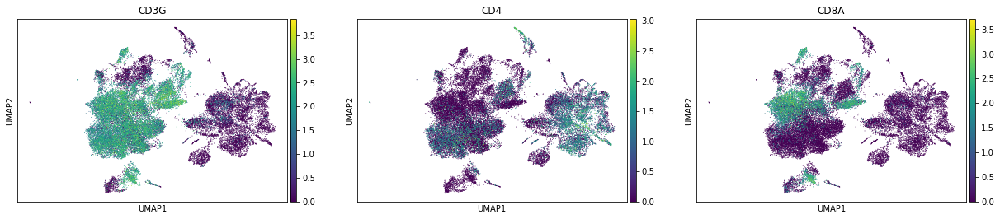

In [44]:
sc.pl.umap(small, color=['CD3G', 'CD4', 'CD8A'])

In [105]:
c2c = {
    'CD4/CD8 CTL': ['16', '32'],
    'CD4 T cell': ['4'],
    'CD4 T cell activated': ['20'],
    'CD4 T cell naive': ['1', '5', '8', '2', '24', '40', '39'],
    'CD4/CD8 proliferating': ['19'],
#     'CD8 CTL': [],
    'CD8 T cell preexhausted': ['13', '29', '35', '41', '42', '0', '6', '31', '10', '25', '26'],
    'Macrophage': ['33', '15', '23', '21', '3', '17', '14', '34', '18', '28', '37', '9', '17', '12'],
#     'Macrophage proliferating': [],
    'NK cell strong': ['22'],
    'NK cell weak': ['7', '30'],
    'TRM': ['38'],
    'Treg': ['11'],
    'cDC': ['36'],
    'pDC': ['27']
}
rc2c = {v:k for k, vs in c2c.items() for v in vs}
small.obs['relabeled'] = [rc2c.get(c, 'unknown') for c in small.obs['leiden']]

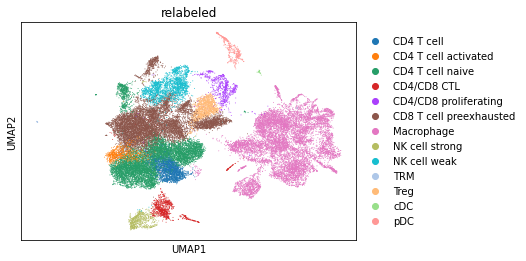

In [89]:
sc.pl.umap(small, color='relabeled')

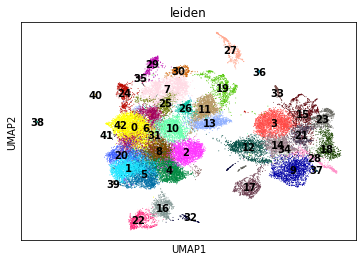

In [83]:
sc.pl.umap(small, color='leiden', legend_loc='on data')

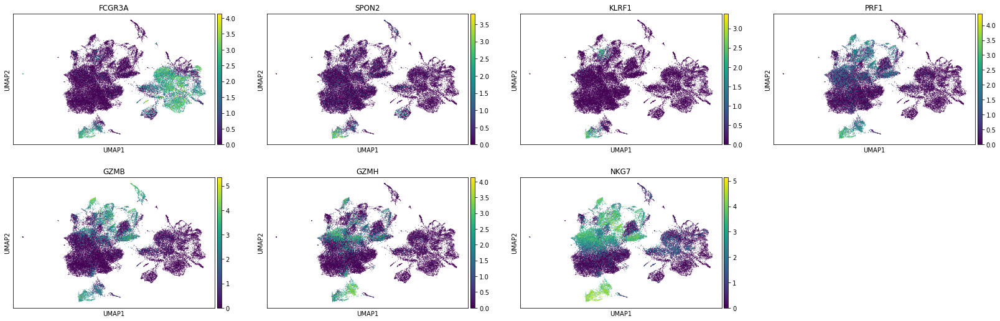

In [40]:
sc.pl.umap(small, color=markers['NK - Strong'])

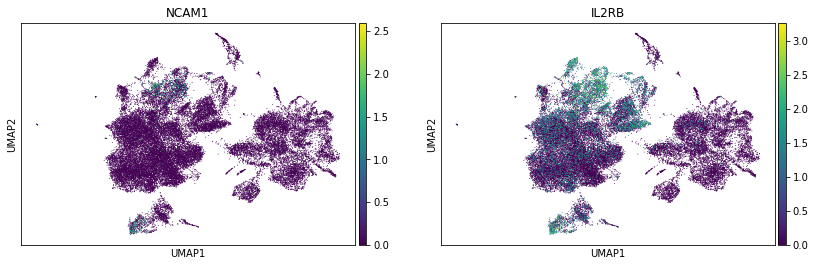

In [41]:
sc.pl.umap(small, color=markers['NK - Weak'])

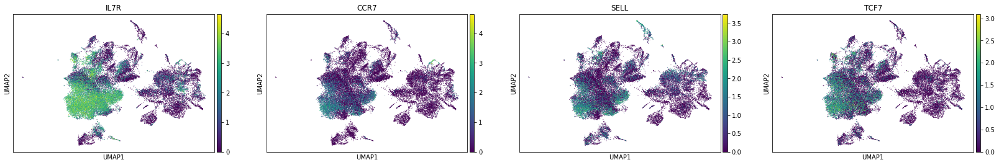

In [33]:
sc.pl.umap(small, color=markers['Naive'])

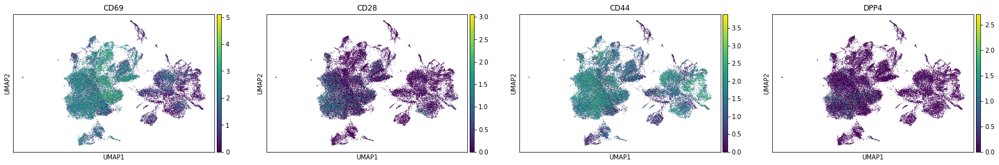

In [34]:
sc.pl.umap(small, color=markers['Activated'])

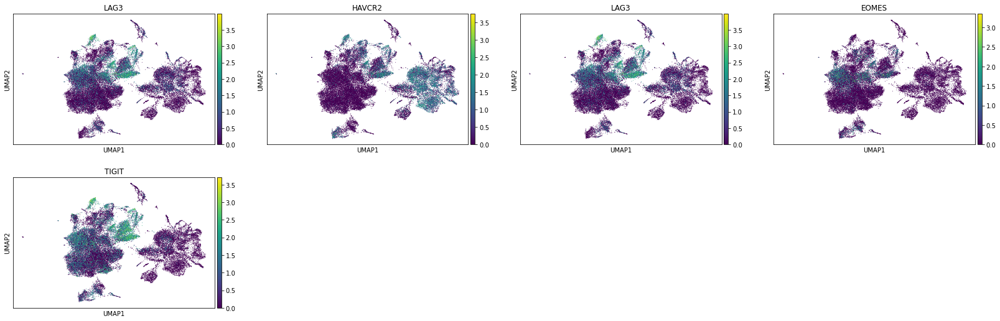

In [35]:
sc.pl.umap(small, color=markers['Exausted'])

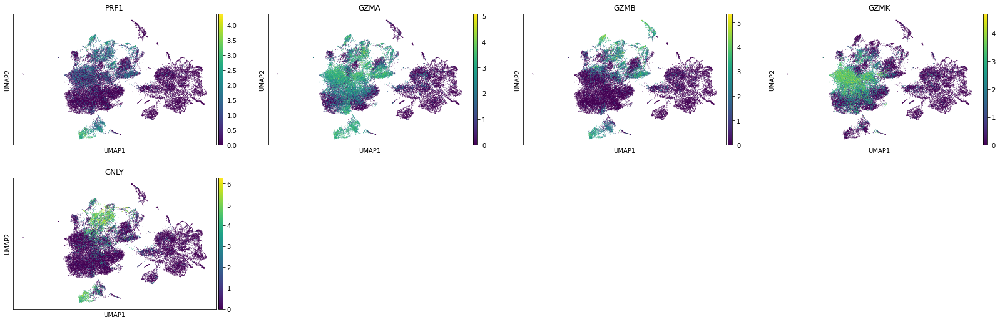

In [39]:
sc.pl.umap(small, color=markers['Effector (CTL)'])

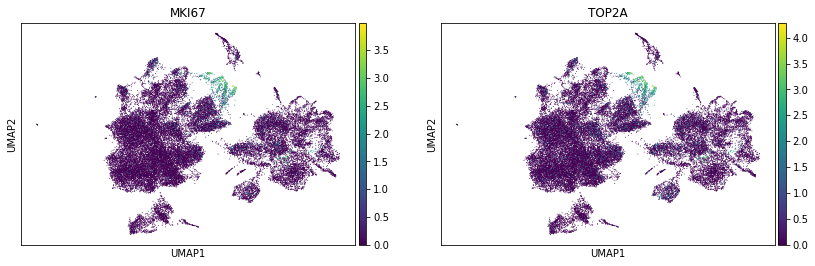

In [46]:
sc.pl.umap(small, color=markers['Proliferating'])

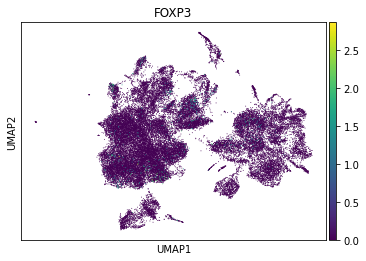

In [54]:
sc.pl.umap(small, color='FOXP3')

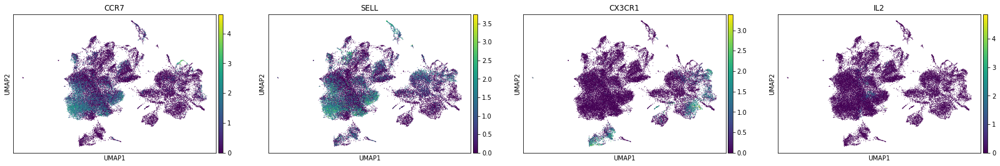

In [53]:
sc.pl.umap(small, color=markers['TCM/TEM'])

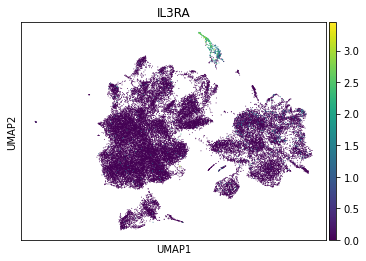

In [56]:
sc.pl.umap(small, color=markers['pDC'])

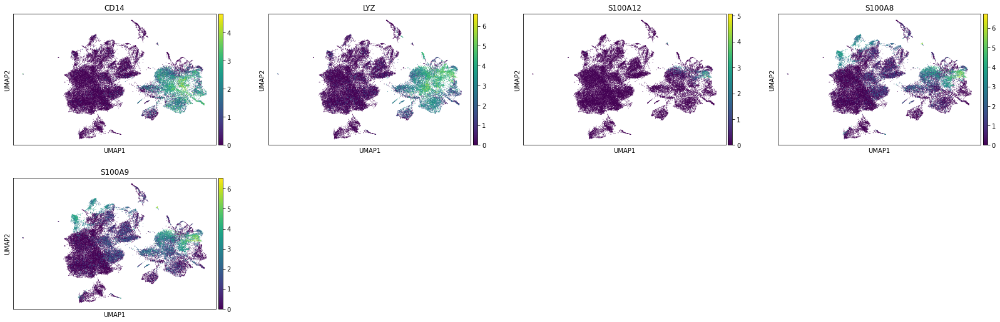

In [60]:
sc.pl.umap(small, color=markers['Monocyte'])

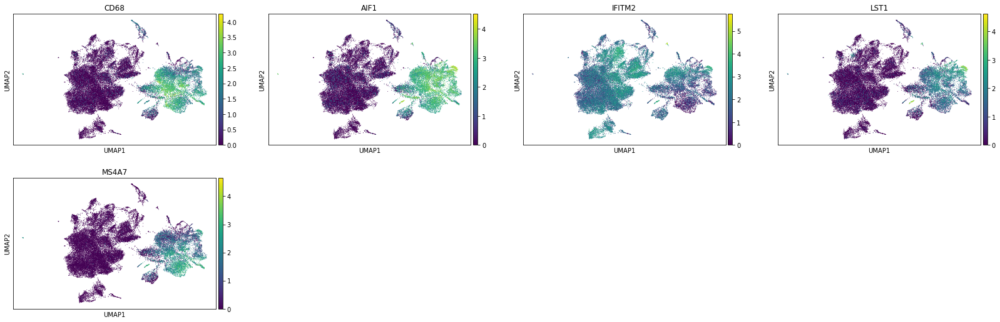

In [61]:
sc.pl.umap(small, color=markers['Macrophage'])

In [91]:
tiny = small[small.obs['relabeled']=='CD4/CD8 CTL'].copy()
tiny

AnnData object with n_obs × n_vars = 896 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.5', 'seurat_clusters', 'sample', 'tissue_type', 'cell_type', 'cell_type_specific', 'Piece_ID', 'Clinical_Subtype', 'Bulk_PAM50', 'doublet_score', 'predicted_doublet', 'ident', 'leiden', 'relabeled'
    var: 'sct.detection_rate', 'sct.gmean', 'sct.variance', 'sct.residual_mean', 'sct.residual_variance', 'sct.variable', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'cell_type_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'logcounts'
    obsp: 'distances', 'connectivities'

In [94]:
sc.tl.pca(tiny, svd_solver='arpack')
sc.pp.neighbors(tiny, n_neighbors=10, n_pcs=20)
sc.tl.umap(tiny)
sc.tl.leiden(tiny)

/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


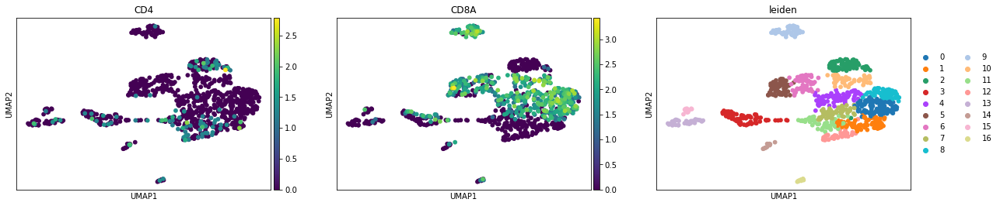

In [97]:
sc.pl.umap(tiny, color=['CD4', 'CD8A', 'leiden'])

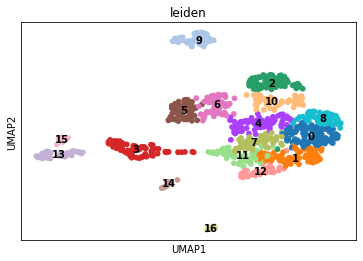

In [98]:
sc.pl.umap(tiny, color=['leiden'], legend_loc='on data')

... storing 'relabeled' as categorical


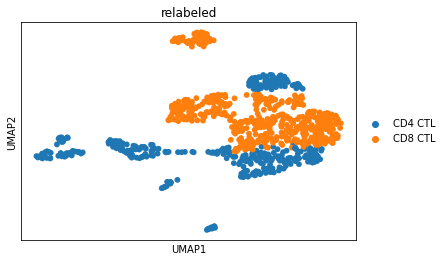

In [101]:
c2c = {
    'CD4 CTL': ['2', '1', '12', '11', '3', '15', '13', '14', '16'],
    'CD8 CTL': ['5', '6', '9', '10', '4', '7', '0', '8']
}
rc2c = {v:k for k, vs in c2c.items() for v in vs}
tiny.obs['relabeled'] = [rc2c.get(c, 'unknown') for c in tiny.obs['leiden']]
sc.pl.umap(tiny, color=['relabeled'])

In [108]:
tiny.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.mito,nCount_SCT,nFeature_SCT,SCT_snn_res.0.5,seurat_clusters,sample,tissue_type,cell_type,cell_type_specific,Piece_ID,Clinical_Subtype,Bulk_PAM50,doublet_score,predicted_doublet,ident,leiden,relabeled
_HT062B1_S1PA_AAACCCACACAAATGA-1,TWCE-HT062B1-S1PAA1A1Z1B1,4837.0,1378,0.043829,4154.0,1378,2,2,HT062B1,Tumor tissue,CD8 T cell,NK,HT062B1_S1PA,TNBC,Her2,0.036018,0,2,4,CD8 CTL
_HT062B1_S1PA_AAACGAATCGTGGCGT-1,TWCE-HT062B1-S1PAA1A1Z1B1,3098.0,1172,0.096191,3487.0,1172,2,2,HT062B1,Tumor tissue,CD8 T cell,NK,HT062B1_S1PA,TNBC,Her2,0.030261,0,2,0,CD8 CTL
_HT062B1_S1PA_AAACGCTGTGGAATGC-1,TWCE-HT062B1-S1PAA1A1Z1B1,5985.0,2181,0.054135,4478.0,2175,2,2,HT062B1,Tumor tissue,CD8 T cell,NK,HT062B1_S1PA,TNBC,Her2,0.028969,0,2,12,CD4 CTL
_HT062B1_S1PA_AAATGGAAGAGTGGCT-1,TWCE-HT062B1-S1PAA1A1Z1B1,3052.0,1166,0.045216,3475.0,1166,2,2,HT062B1,Tumor tissue,CD8 T cell,NK,HT062B1_S1PA,TNBC,Her2,0.037625,0,2,2,CD4 CTL
_HT062B1_S1PA_AACAAGATCGAGAGAC-1,TWCE-HT062B1-S1PAA1A1Z1B1,3598.0,1396,0.031128,3676.0,1396,2,2,HT062B1,Tumor tissue,CD8 T cell,NK,HT062B1_S1PA,TNBC,Her2,0.030261,0,2,0,CD8 CTL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
_HT171B1_BC2_GTTACCCTCTGGACCG-1,TWCE-HT171B1-BC2,3173.0,1096,0.066183,3537.0,1096,2,2,HT171B1,Tumor tissue,CD8 T cell,CD4_T,HT171B1_S1H8,TNBC,Basal,0.052156,0,2,1,CD4 CTL
_HT171B1_BC2_TATCAGGCAGCCTACG-1,TWCE-HT171B1-BC2,2235.0,993,0.065324,3303.0,995,8,8,HT171B1,Tumor tissue,CD8 T cell,CD8_T_exhausted,HT171B1_S1H8,TNBC,Basal,0.040528,0,8,9,CD8 CTL
_HT171B1_BC2_TCCATGCTCGGTAGAG-1,TWCE-HT171B1-BC2,3098.0,1301,0.046159,3470.0,1301,8,8,HT171B1,Tumor tissue,CD8 T cell,CD8_T_exhausted,HT171B1_S1H8,TNBC,Basal,0.042593,0,8,4,CD8 CTL
_HT171B1_BC2_TGGATCAAGTGAACAT-1,TWCE-HT171B1-BC2,2139.0,1046,0.044413,3266.0,1049,2,2,HT171B1,Tumor tissue,CD8 T cell,CD4_T,HT171B1_S1H8,TNBC,Basal,0.022958,0,2,9,CD8 CTL


/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'relabeled' as categorical


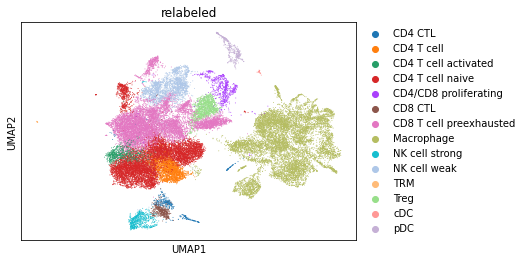

In [110]:
small.obs['relabeled'] = [tiny.obs.loc[i, 'relabeled'] if c=='CD4/CD8 CTL' else c
                            for i, c in zip(small.obs.index, small.obs['relabeled'])]
sc.pl.umap(small, color='relabeled')

/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'relabeled' as categorical


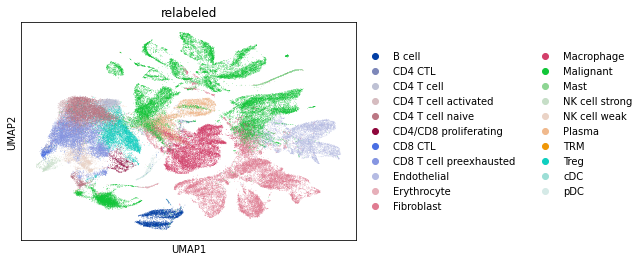

In [111]:
adata.obs['relabeled'] = [small.obs.loc[i, 'relabeled'] if c in include else c
                            for i, c in zip(adata.obs.index, adata.obs['cell_type'])]
sc.pl.umap(adata, color='relabeled')

In [112]:
adata.obs['cell_type']= adata.obs['relabeled'].to_list()

In [113]:
new = sc.read_h5ad('/home/estorrs/pollock/benchmarking/data/11302020_harmonized/teir_1/scRNAseq/brca.h5ad')
new

AnnData object with n_obs × n_vars = 98564 × 27131
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.5', 'seurat_clusters', 'sample', 'tissue_type', 'cell_type', 'cell_type_specific', 'Piece_ID', 'Clinical_Subtype', 'Bulk_PAM50', 'doublet_score', 'predicted_doublet', 'ident'
    var: 'sct.detection_rate', 'sct.gmean', 'sct.variance', 'sct.residual_mean', 'sct.residual_variance', 'sct.variable'
    obsm: 'X_pca', 'X_umap'
    layers: 'logcounts'

In [114]:
new.obs['cell_type'] = [adata.obs.loc[i, 'cell_type'] for i in new.obs.index]

... storing 'cell_type' as categorical


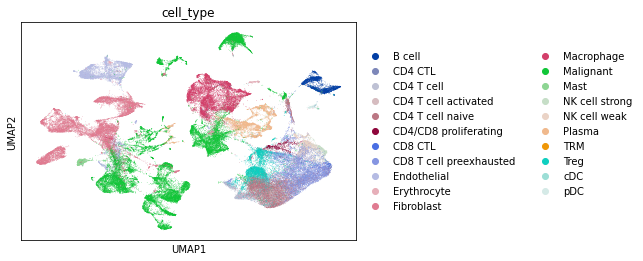

In [115]:
sc.pl.umap(new, color='cell_type')

In [119]:
from collections import Counter
Counter(new.obs['cell_type'])

Counter({'CD8 CTL': 512,
         'Endothelial': 6188,
         'Fibroblast': 14769,
         'Malignant': 27884,
         'CD8 T cell preexhausted': 9131,
         'CD4 CTL': 384,
         'NK cell strong': 614,
         'Macrophage': 10089,
         'Treg': 5699,
         'CD4 T cell': 1982,
         'CD4 T cell naive': 8399,
         'NK cell weak': 2003,
         'cDC': 24,
         'B cell': 2972,
         'CD4/CD8 proliferating': 691,
         'CD4 T cell activated': 667,
         'pDC': 404,
         'Plasma': 4879,
         'Mast': 746,
         'TRM': 12,
         'Erythrocyte': 515})

In [116]:
new.write_h5ad('/home/estorrs/data/single_cell_classification/immune/scRNA_brca.h5ad')

In [117]:
from pollock.models.model import PollockDataset, PollockModel

In [120]:
pds = PollockDataset(new.copy(), n_per_cell_type=200, )

2020-12-22 16:13:20,991 input dataset shape: (98564, 27131)
2020-12-22 16:13:21,003 possible cell types: ['B cell', 'CD4 CTL', 'CD4 T cell', 'CD4 T cell activated', 'CD4 T cell naive', 'CD4/CD8 proliferating', 'CD8 CTL', 'CD8 T cell preexhausted', 'Endothelial', 'Erythrocyte', 'Fibroblast', 'Macrophage', 'Malignant', 'Mast', 'NK cell strong', 'NK cell weak', 'Plasma', 'TRM', 'Treg', 'cDC', 'pDC']
/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [121]:
pm = PollockModel(pds.cell_types, pds.train_adata.shape[1], alpha=.005, latent_dim=25, )

In [122]:
pm.fit(pds, epochs=20, )

/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


2020-12-22 16:15:50,060 5 out of the last 40 calls to <function compute_loss at 0x7f0504623710> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings is likely due to passing python objects instead of tensors. Also, tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. Please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for more details.
/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
2020-12-22 16:15:52,240 epoch: 1, train loss: 20.79535484313965, val loss: 22.609209060668945
/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:10

/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
2020-12-22 16:18:48,854 epoch: 14, train loss: 19.031696319580078, val loss: 20.731199264526367
/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is

In [124]:
pm.save(pds, '/home/estorrs/data/single_cell_classification/immune/scRNA_brca_immune_states')

/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/numpy/lib/format.py:350: UserWarning: metadata on a dtype may be saved or ignored, but will raise if saved when read. Use another form of storage.
  d['descr'] = dtype_to_descr(array.dtype)
/home/estorrs/miniconda3/envs/pollock_dev/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Text(32.99999999999999, 0.5, 'Groundtruth')

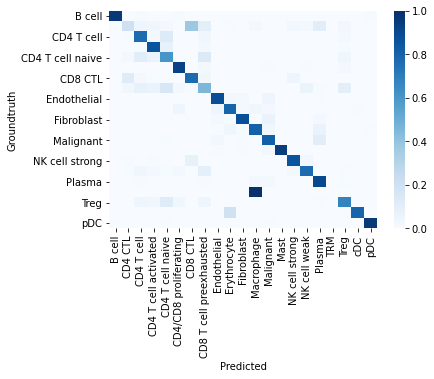

In [126]:
import seaborn as sns
confusion_matrix = pd.DataFrame(data=pm.summary['validation']['confusion_matrix'], columns=pm.class_names,
                  index=pm.class_names)
sns.heatmap(confusion_matrix, cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Groundtruth')